# Spatial Pattern of Electric Vehicle Population in State of Washington

DSAN 6750 / PPOL 6805: GIS for Spatial Data Science

Christy Hsu (Georgetown University)

## Intro

This project attempts to provide insights into the spatial pattern of EV adoptionusing approaches from spatial data science.

The Electric Vehicle Population Data provided by Washington State Department of Licensing is the main dataset used in this project.([“Electric Vehicle Population Data Data.WA State of Washington” 2024](#ref-ElectricVehiclePopulation))

Two main sections in this project cover:

Initial Evidence

-   Visualization
-   Global Moran’s I
-   Local Moran’s I

Hypothesis Testing

-   Intensity Function
-   Relative Intensity Surface
-   Monte Carlo Simulation

### Set up

#### packages

In [ ]:
library(tidyverse) |> suppressPackageStartupMessages()
library(sf) |> suppressPackageStartupMessages()
library(mapview) |> suppressPackageStartupMessages()
library(spatstat) |> suppressPackageStartupMessages()
library(viridis) |> suppressPackageStartupMessages()
library(spatialreg) |> suppressPackageStartupMessages()
library(spdep) |> suppressPackageStartupMessages()
library(evd) |> suppressPackageStartupMessages()
library(Pareto) |> suppressPackageStartupMessages()
library(raster) |> suppressPackageStartupMessages()
library(fields) |> suppressPackageStartupMessages()
library(scales) |> suppressPackageStartupMessages()
library(gmodels) |> suppressPackageStartupMessages()
cb_palette <- c(
  "#E69F00", "#56B4E9", "#009E73", "#F0E442","#0072B2", "#D55E00", "#CC79A7"
)

#### loading files

In [ ]:
ev_fpath <- 'data/ev1203.gpkg'
wa_poly_fpath <- 'data/wa_poly.gpkg'
urban_fpath <- 'data/urban_shape.gpkg'
station_fpath <- 'data/stations.gpkg'
fips_fpath <- 'data/ct1202.csv'
ctsf_fpath <- 'data/ct1202.gpkg'
ev_fpath7 <- 'data/ev1202-3.gpkg'
zcta_fpath <- 'data/zcta-tl.gpkg'

gpw_pt_fpath <- 'data/gpw-pts-popcount.csv'
gpw_pop_fpath <- 'data/gpw-popcount.tif'
nov_ev_fpath <- 'data/nov-ev.gpkg'

In [ ]:
ev_sf <- sf::st_read(ev_fpath)

Reading layer `ev1203' from data source 
  `/Users/toyuan/24-manuscript/data/ev1203.gpkg' using driver `GPKG'
Simple feature collection with 208002 features and 25 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -124.6274 ymin: 45.596 xmax: -117.0455 ymax: 48.99205
Geodetic CRS:  WGS 84

Rows: 1784 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (7): COUNTYFP20, TRACTCE20, NAMELSAD20, MTFCC20, FUNCSTAT20, house_medi...
dbl (13): STATEFP20, fips, NAME20, ALAND20, AWATER20, INTPTLAT20, INTPTLON20...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Reading layer `wa_poly' from data source 
  `/Users/toyuan/24-manuscript/data/wa_poly.gpkg' using driver `GPKG'
Simple feature collection with 1 feature and 14 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -124.849 ymin: 45.54354 xmax: -116.9161 ymax: 49.00244
Geodetic CRS:  NAD83

Reading layer `urban_shape' from data source 
  `/Users/toyuan/24-manuscript/data/urban_shape.gpkg' using driver `GPKG'
Simple feature collection with 56 features and 12 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -124.1802 ymin: 45.78668 xmax: -117.0418 ymax: 49.0021
Geodetic CRS:  WGS 84

Reading layer `stations' from data source 
  `/Users/toyuan/24-manuscript/data/stations.gpkg' using driver `GPKG'
Simple feature collection with 2800 features and 1 field
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -124.6629 ymin: 25.91606 xmax: -73.98274 ymax: 48.99526
Geodetic CRS:  WGS 84

Reading layer `ct1202' from data source 
  `/Users/toyuan/24-manuscript/data/ct1202.gpkg' using driver `GPKG'
Simple feature collection with 1784 features and 19 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -124.849 ymin: 45.54354 xmax: -116.9161 ymax: 49.00244
Geodetic CRS:  WGS 84

Reading layer `ev1202-3' from data source 
  `/Users/toyuan/24-manuscript/data/ev1202-3.gpkg' using driver `GPKG'
Simple feature collection with 208002 features and 24 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -124.6274 ymin: 45.596 xmax: -117.0455 ymax: 48.99205
Geodetic CRS:  WGS 84

Reading layer `zcta-tl' from data source 
  `/Users/toyuan/24-manuscript/data/zcta-tl.gpkg' using driver `GPKG'
Simple feature collection with 605 features and 12 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -124.7365 ymin: 45.54354 xmax: -116.9161 ymax: 49.00244
Geodetic CRS:  WGS 84

Rows: 548 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): SEDAC_Tile, GPW_DataQualityInd_411_data-context_Data_Context_Descr...
dbl  (7): ID, Latitude, Longitude, GPW_UN_Adj_PopCount_411_Line_Y_1km, GPW_U...
date (1): Date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Reading layer `nov-ev' from data source 
  `/Users/toyuan/24-manuscript/data/nov-ev.gpkg' using driver `GPKG'
Simple feature collection with 17025 features and 15 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -124.6274 ymin: 30.41628 xmax: -71.06739 ymax: 48.99976
Geodetic CRS:  WGS 84

#### Functions

function `to_3857` `to_4326` for CRS transform

In [ ]:
to_3857 <- function(sf0){
  tr_sf <- sf0 |> sf::st_transform(3857)
  return(tr_sf)
}
to_4326 <- function(sf0){
  tr_sf <- sf0 |> sf::st_transform(4326)
  return(tr_sf)
}

function `sf_to_ppp`[1]

[1] to construct marked ppp, extra steps are needed

In [ ]:
sf_to_ppp <- function(sf0){
  prep_sf <- sf0 |> to_3857() |> sf::st_as_sfc()
  prep_win <- wa_poly |> to_3857() |> as.owin()

  ppp0 <- as.ppp(
    prep_sf,
    W = prep_win
  )
  return(ppp0)
}

function `relative_int`

In [ ]:
relative_int <- function(case_ppp, contr_ppp, eps = 800) {

  cases_bw <- attr(density(case_ppp), 'sigma')
  contr_bw <- attr(density(contr_ppp), 'sigma')
  bw0 <- (cases_bw + contr_bw) / 2

  cas_int <- density(case_ppp, weights = case_ppp$marks, eps = eps, sigma = bw0)
  contr_int <- density(contr_ppp, weights = contr_ppp$marks, eps = eps, sigma = bw0)

  alphahat0 <- case_ppp$n / contr_ppp$n

  x0 <- cas_int$xcol
  y0 <- cas_int$yrow
  rr0 <- t(cas_int$v) / t(alphahat0 * contr_int$v)

  image.plot(x0, y0, rr0, asp = 1)    # main = 'title'
}

## Initial Evidence

This exploratory section approaches EV population in WA as a point pattern, efforts are made to convince that EV adoption is interesting not only as an event but also as a spatial phenomenon. Our approaches includes: landing descriptions of our data, map visualizations and spatial autocorrelation measures.

### Visualization

Before presenting our evidence of clustering in the spatial pattern of EVs, we would like to start with some clarification about the “points” and their locations in our data. Each observation in the dataset represents an EV with its unique DOL id. However, the longitude and latitude information corresponds to the centroid of that Zip Code Tabulation Area associated with the recorded address of the EV owner. Thus, 208,002 distinct EVs are matched to only 548 distinct points.

`ev_counts`

In [ ]:
ev_counts <- ev_sf |> group_by(location) |> summarize(count = n())
ev_counts |> nrow()

[1] 548

From the frequency table of counties, we can see that EV population exists across all counties in WA. When plotting EV count per county as a statistic, a skewed distribution gives us the first evidence of the variance in EV adoption counts across regional divisions.

With map visualization of the EV locations and counts in Washington, an impression we might have is that EV adoption as an event does not seem to be constant between locations. Furthermore, when looking at the map, we might suggest detecting clusters in specific locations and, for example, identifying these clusters with the three of the main metropolitan areas that the state overlaps.[1]([Bureau n.d.](#ref-bureauMetropolitanMicropolitanStatistical))

The Seattle-Tacoma-Bellevue Metropolitan area in the northwest; a mid-western cluster corresponding to Spokane-Spokane Valley Metropolitan area; and another approximately in Clark county, with Vancouver city to take part of the cross-states Portland-Vancouver-Hillsboro Metropolitan area.

``` r
urb_map <- ggplot() +
  geom_sf(data = ct_sf, fill = "lightgray", color = "white", size = 0.2) + 
  geom_sf(data = ev_sf, aes(size = count), color = 'cornflowerblue', alpha = 0.5) +
  geom_sf(data = urban_poly, aes(fill = "Urban Areas"), color = "pink", alpha = 0.3) +
  scale_size_continuous(name = "EV Registrations", range = c(1, 12)) +
  scale_fill_manual(name = "Legend", values = c("Urban Areas" = "pink")) +
  labs(
    title = "Distribution of EV registrations in WA",
    subtitle = "urban areas"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16),
    plot.subtitle = element_text(hjust = 0.5, size = 12)
  )

# ggsave("image/manu-urb-ev.png", plot = urb_map)
urb_map
```

At this stage, we are led to understand the concentration of EV registrations at certain areas, or the attribute similarity of EV counts and their spatial similarity, by suggesting relationships between EV adoption, urban areas and population.

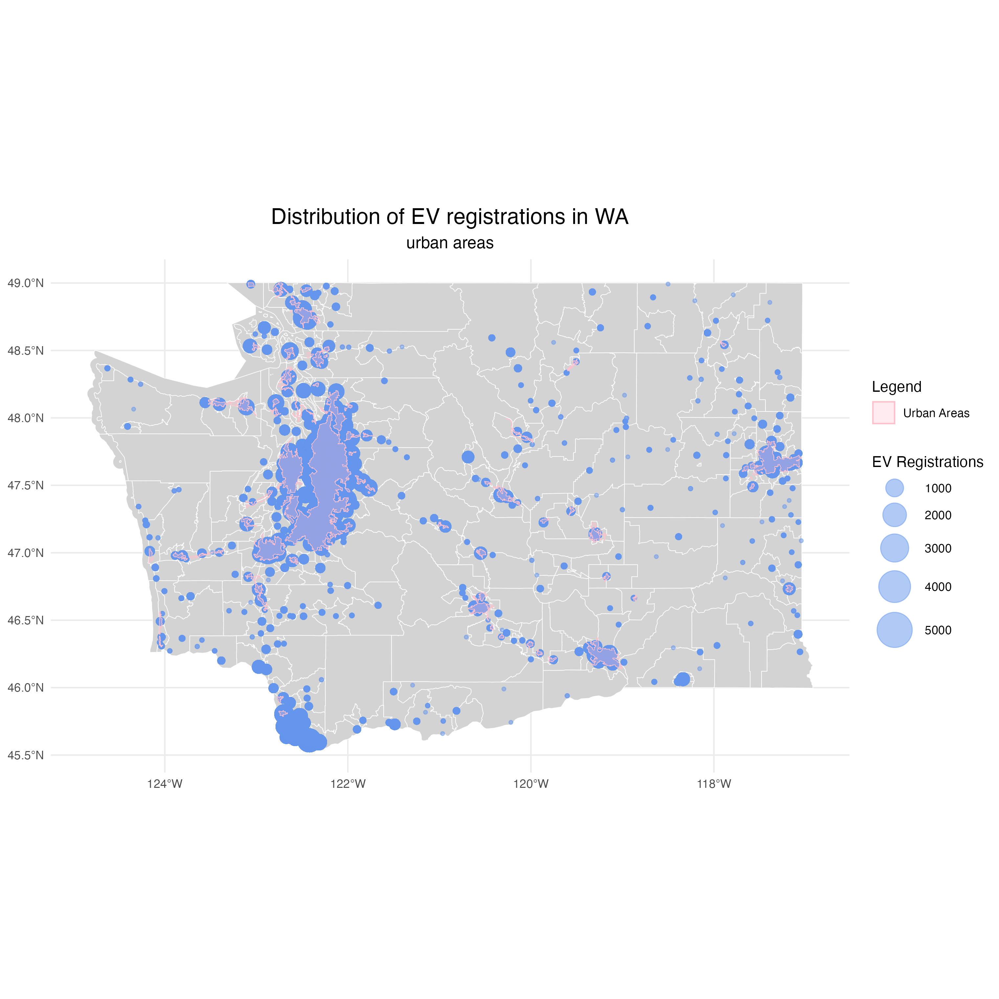

Using the definition provided by US Census Bureau, we can assign urban or rural labels to each registration. We learn from this classification that 180,490 registrations took place in urban areas, leaving 27,512 in rural areas. This spatial unevenness is evident when we impose the polygons of urban areas onto the EV population distribution.

### Spatial Autocorrelation

Aside from descriptive statistics and mapping, if we seek a more analytical language for communicating our EDA insights, one common approach is to measure spatial autocorrelation for our data.

#### Global moran’s I: Clustering of EV registrations

Firstly, we are interested in measuring the autocorrelation of the whole mapped pattern. The way we determine whether our observed point pattern stands out, is to make comparison with the pattern out of complete spatial randomness. The Global Moran’s I statistic offers us a way to measures the autocorrelation of the entire observations.

To estimate the autocorrelation value for our observations using Moran’s I formula, we have to specify our statistic of interest, choose a neighbor definition, prepare a neighborhood relation and assign weights to neighbors.

function `compute_moran`

[1] Seattle-Tacoma-Bellevue (WA),Portland-Vancouver-Hillsboro (OR-WA), Spokane-Spokane Valley (WA) are the three metropolitan areas listed as the top 100 populous metro areas by the Census Bureau, ranking 15th, 25th and 96th respectively

In [ ]:
compute_moran <- function(nb, listw, poly_sf){
  n <- length(nb)
  S0 <- Szero(listw)
  x <- poly_sf$n_ev
  moran_result <- spdep::moran(x, listw, n, S0)
  return(moran_result)
}

We tried two ways to use `spdep::moran` for calculating Global Moran’s I. The step we take her is to aggregate observed points into polygons, ZIP Code Tabulation Areas which contain 605 polygons, and Census Tracts of 1784 polygons, are two targets of aggregation.[1] When constructing the neighborhood relationships, both Rook and Queen defintions of neighbors are tried, and we used the default setting to assign equal weight to all neighbors. Both attempts are to result in a postive autocorrelation of our observations, pointing us in the direction of non-random spatial clustering.

However, the positivity of this autocorrelation value is not that fruitful on its own. For us to reject CSR or to make sense of the significance of our observed Moran’s I statistic, we further did a permutation test using `spdep::moran.mc()` and obtained a pseudo p-value of 0.001. Since this is the most extreme value we can get in the case of 999 Monte Carlo Simulations, the likelihood that we reject CSR while CSR is true is a low one. Given a positive and significant global moran’s I, we can say that our observe point pattern differs significantly from a random point pattern in the direction of clustering.([R Consortium 2022](#ref-rconsortiumAnalyzingGeospatialData2022))

##### Moran’s I using ZCTAs as bounding polygons and Queen Definition of Neighbors

[1] The reason that I did not simply use ZCTAs is although the codebook describes the location variable as the center of postal code areas, but the provided longitude and latitude did not align well with the centroids of ZCTAs from tiger/line shapefile, with cases that more than one points fell within a single ZCTA

In [ ]:
zcta_sf <- zcta_sf |> to_4326()
zcta_intersects <- sf::st_intersects(zcta_sf, ev_counts)
sum_evs <- function(i) {
  if (length(i) != 0) {
    sum_count <- sum(ev_counts$count[i])
    return(sum_count)
  }
  else{
    return(0)
  }
}

num_ev <- sapply(zcta_intersects, sum_evs)
# num_ev |> sum()

In [ ]:
zcta_sf <- zcta_sf |> mutate(n_ev = num_ev)

In [ ]:
zcta_nb <- zcta_sf |> spdep::poly2nb()    # default snap = 1e-7

Warning in spdep::poly2nb(zcta_sf): some observations have no neighbours;
if this seems unexpected, try increasing the snap argument.

Warning in spdep::poly2nb(zcta_sf): neighbour object has 5 sub-graphs;
if this sub-graph count seems unexpected, try increasing the snap argument.

[1] 0.6457255

In [ ]:
zcta_mc <- moran.mc(zcta_sf$n_ev, zcta_listw, nsim = 999, alternative = 'greater')
zcta_mc


    Monte-Carlo simulation of Moran I

data:  zcta_sf$n_ev 
weights: zcta_listw  
number of simulations + 1: 1000 

statistic = 0.64146, observed rank = 1000, p-value = 0.001
alternative hypothesis: greater

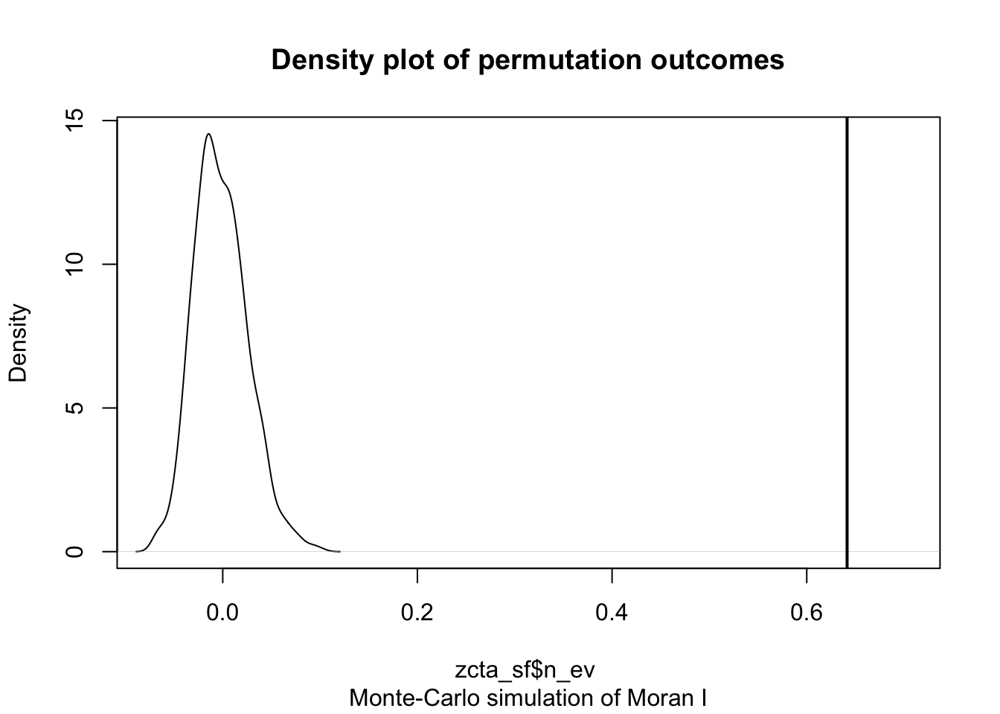

In [ ]:
zcta_mc |> plot()

##### Moran’s I using Census Tracts as bounding polygons and Rook definition of neighbors

In [ ]:
ev_byct <- ev_sf |> group_by(fips) |> summarize(n_ev = n()) |> ungroup()
ct_sf <- ct_sf |> left_join(st_drop_geometry(ev_byct), by = 'fips') |> mutate(n_ev = replace_na(n_ev, 0))

ct_sf$n_ev |> sum()

[1] 208002

In [ ]:
ct_nb <- ct_sf |> spdep::poly2nb(queen = FALSE)
ct_listw <- ct_nb |> spdep::nb2listw(zero.policy = TRUE)
# print(ct_nb)

Moran’s I value

In [ ]:
ct_result <- compute_moran(ct_nb, ct_listw, ct_sf)
ct_result[[1]]

[1] 0.5136527

##### visualize neiborhood relation

In [ ]:
ct_nb_cents <- ct_sf |> st_drop_geometry() |> sf::st_as_sf(coords = c("INTPTLON20", "INTPTLAT20"), crs = 4326)

ct_nb_lines <- ct_nb |> spdep::nb2lines(coords=st_coordinates(ct_nb_cents), as_sf=TRUE)

# mapview(ct_nb_cents) + mapview(ct_nb_lines)
# from w5

In [ ]:
ct_mc <- moran.mc(ct_sf$n_ev, ct_listw, nsim = 999, alternative = 'greater')
ct_mc


    Monte-Carlo simulation of Moran I

data:  ct_sf$n_ev 
weights: ct_listw  
number of simulations + 1: 1000 

statistic = 0.51365, observed rank = 1000, p-value = 0.001
alternative hypothesis: greater

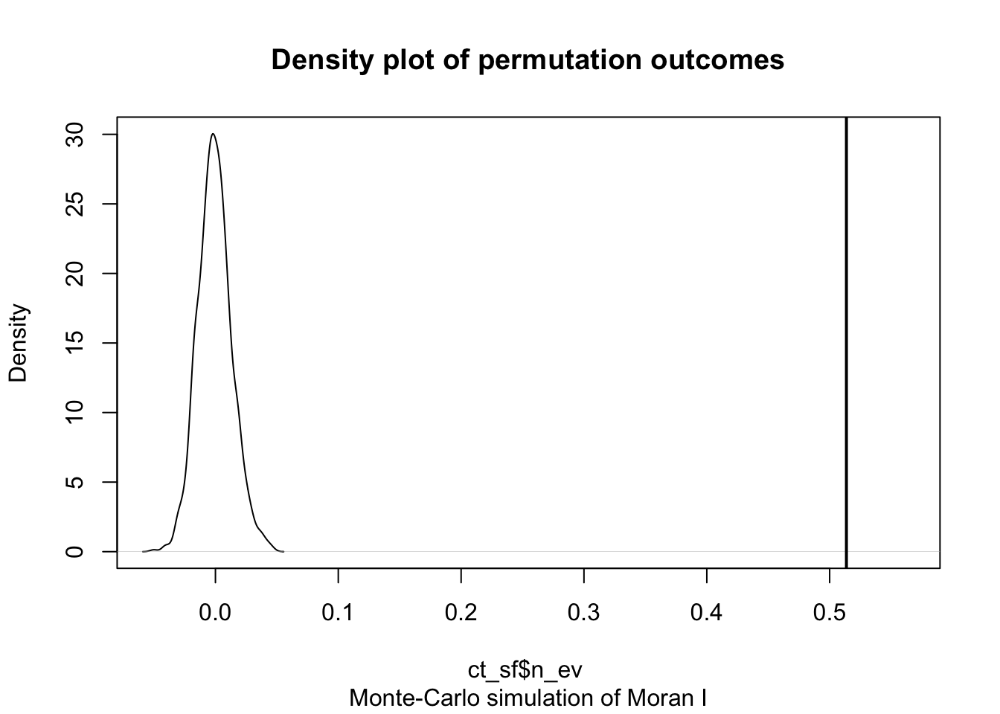

In [ ]:
ct_mc |> plot()

#### Local Moran’s I: detecting clusters

With evidence of clustering globally, we also want information about where we can find the clusters. In this case, `spdep::localmoran` can help use with a Moran’s I statistic for each census tract.([GeoDa Software 2021](#ref-geodasoftwareWeek6aLISA2021))

In [ ]:
ev_ct_localmoran <- spdep::localmoran(
  ct_sf$n_ev,
  ct_listw)
ev_ct_localmoran |> class()

[1] "localmoran" "matrix"     "array"     

[1] 1784    5

In [ ]:
ct_local_df <- as_tibble(ev_ct_localmoran)
colnames(ct_local_df) <- c(
  'local_i', 
  'local_e',
  'local_var',
  'local_sd',
  'local_p'
  )

In [ ]:
ct_sf7 <- ct_sf |> bind_cols(ct_local_df)
ct_sf7 |> dim()

[1] 1784   26

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.28334  0.03044  0.19644  0.51365  0.46033 26.79675 

``` r
ev_ct_local <- ct_sf7 |> ggplot() +
  geom_sf(aes(fill= as.numeric(local_i))) +
  labs(
    title = "Local moran's I by Census Tracts",
    fill = "local_i"
  ) +
  scale_fill_gradient2(low="darkblue", high="red",
  transform = "pseudo_log")
# +
  scale_fill_viridis_c(na.value = "gray")
# ggsave('image/ct_localmoran.png', ev_ct_local)
ev_ct_local
```

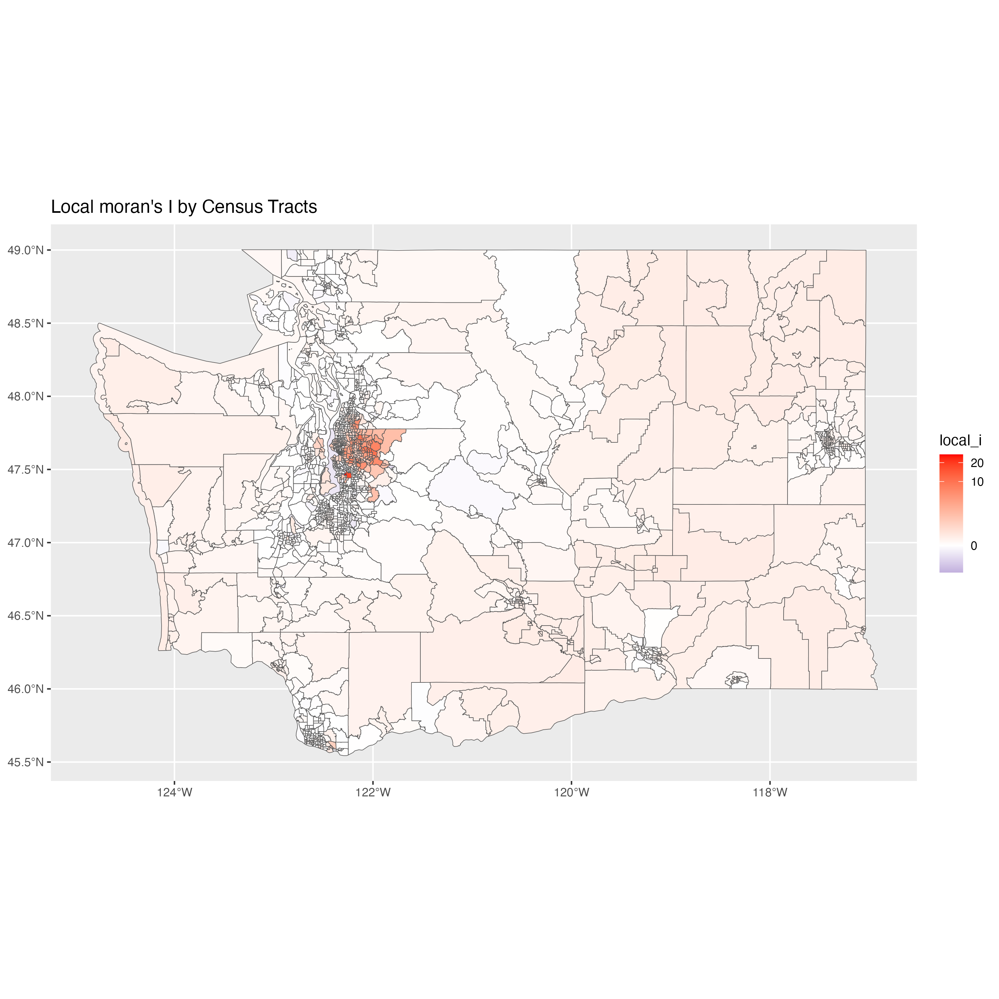

Local Moran’s I significance map

``` r
ev_ct_local_p <- ct_sf7 |> ggplot() +
  geom_sf(aes(fill= as.numeric(local_p))) +
  labs(
    title = "Local moran's I by Census Tracts",
    fill = "local_p"
  ) +
  scale_fill_gradient2(low="darkred", high="blue", midpoint=0.1)
# +
  scale_fill_viridis_c(na.value = "gray")
# ggsave('image/ct_localmoran_p.png', ev_ct_local_p)
ev_ct_local_p
```

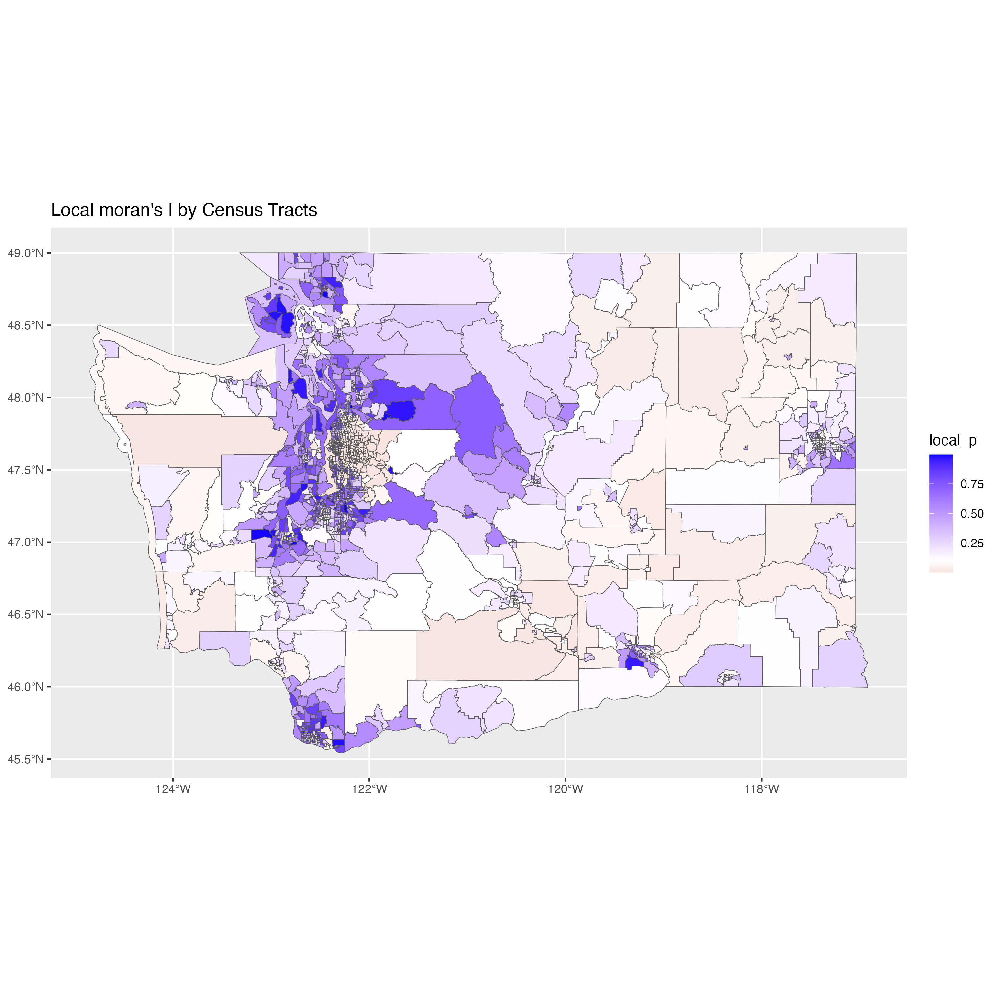

##### local moran permutation test

In [ ]:
ct_localmoran_perm <- spdep::localmoran_perm(
  ct_sf$n_ev,
  ct_listw,
  nsim = 999,
  iseed = 6805
  )
ct_localmoran_perm |> class()

[1] "localmoran" "matrix"     "array"     

[1] 1784    9

In [ ]:
ct_localmoran_perm |> head(2)

           Ii          E.Ii       Var.Ii       Z.Ii Pr(z != E(Ii))
1 -0.19651842 -0.0031906570 6.079843e-02 -0.7840577      0.4330062
2  0.00244076  0.0005481923 6.916542e-05  0.2275657      0.8199839
  Pr(z != E(Ii)) Sim Pr(folded) Sim  Skewness Kurtosis
1              0.406          0.203  2.272828 12.18684
2              0.934          0.467 -2.498880 18.68960

From the conditional permutation test, we can plot local significance map and specify different types of associations. The table below is a count table for a Moran scatter plot, we can see that among 521 census tracts with significant pseudo p-values 306 census tracts exhibit Low-Low associations, 205 census tracts for High-High associations.

In [ ]:
sign_factor <- hotspot(
  ct_localmoran_perm,
  Prname="Pr(z != E(Ii)) Sim",
  cutoff=0.05,
  p.adjust="none"
  )
table(addNA(sign_factor))


  Low-Low  High-Low  Low-High High-High      <NA> 
      306         8        15       205      1250 

In [ ]:
ct_sf7$scatter <- sign_factor

LISA Cluster Map

``` r
local_perm_map <- ct_sf7 |> ggplot() +
geom_sf(aes(fill = scatter)) +
labs(
  title = "LISA Cluster Map",
  fill = "locations"
) +
scale_fill_manual(
  values = c(
    'High-High' = 'red',
    'High-Low' = 'pink',
    'Low-High' = 'lightblue',
    'Low-Low' = 'blue'
  ),
  na.value = 'white'
)
local_perm_map
# ggsave('image/manu-lisa-cluster.png', local_perm_map)
```

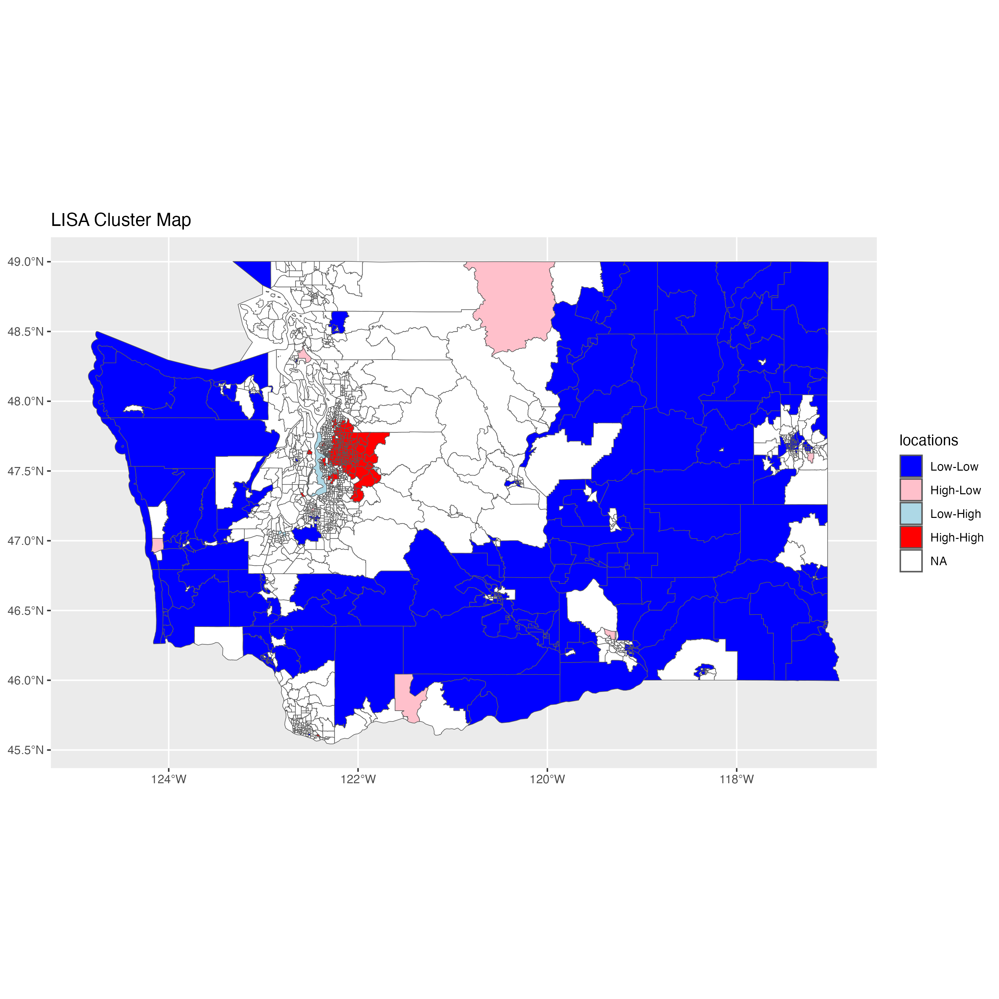

Local Moran’s I, pseudo p-values from conditional permutation test, and identification of the association types for the significant census tracts, take us to a more in depth understanding of our EV point pattern. Insight into the hotspots and coldspots of EV adoption, corresponding to High-High census tracts and Low-Low census tracts is especially helpful because we are inclined to see the hotspots but ignore the coldspots. The LISA Cluster Map reveals to us the clusters centered census tracts with low EV population itself and also surrounded by neighbors with low EV population, this finding is hardly possible to get if we only have the positive cases, or already EV owning househols to visualize. One important aspect of interpreting positive spatial autocorrelation is demonstrated here, we need to think of the bigger picture of clustering as the contribution of attribute, in our case EV count similarity and locational similarity, thus, we won’t ignore clusters that have similar low EV counts also have a role to play in this picture.

## Hypothesis Testing

This section attempts to deal with another aspect we need to account for when acquiring a positive and significant global autocorrelation value for our point pattern of interest. In our case, we want to evaluate how the spatial inhomogeneity of the Washington state can explain for our initial evidence of clustering.

We want to understand the first-order properties of EV adoption pattern with the awareness of the underlying landscape of the state they have an effect on the adoption potential of different locations. We can take a look at our EV population distribution together with the human population distribution in WA. They appeared to follow very similar distribution, and we do recognize that the core of the definition of an urban area is the spatial distribution of population.

Thus, it will be helpful to set aside other characteristics we associate with the urban label at the time, examine the relationship between the two populations in WA. We expect a better understanding of this relationship can guide us to explore to which extent that the EV counts variations across locations can be explained by the population count variations, and how population distribution as a explanation can have different degrees of effectiveness from one region to another.

``` r
distribution_map <- ggplot() +
  geom_sf(data = ct_sf, fill = "lightgray", color = "white", size = 0.2) + 
  geom_sf(
    data = ev_sf,
    aes(size = count,
    color = cb_palette[5]),
    alpha = 0.6) +
    scale_size_continuous(name = "EV Registrations", range = c(0.1, 15)) + 
    labs(
    title = "Distribution of ZEVs in WA",
    subtitle = "Cumulative data to October 31, 2024",
    x = "longitude",
    y = "latitude"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 14),
    plot.subtitle = element_text(hjust = 0.5, size = 11)
  ) +
  guides(color = "none")

ggsave("image/manu-ev-distribution.png", plot = distribution_map)

distribution_map
```

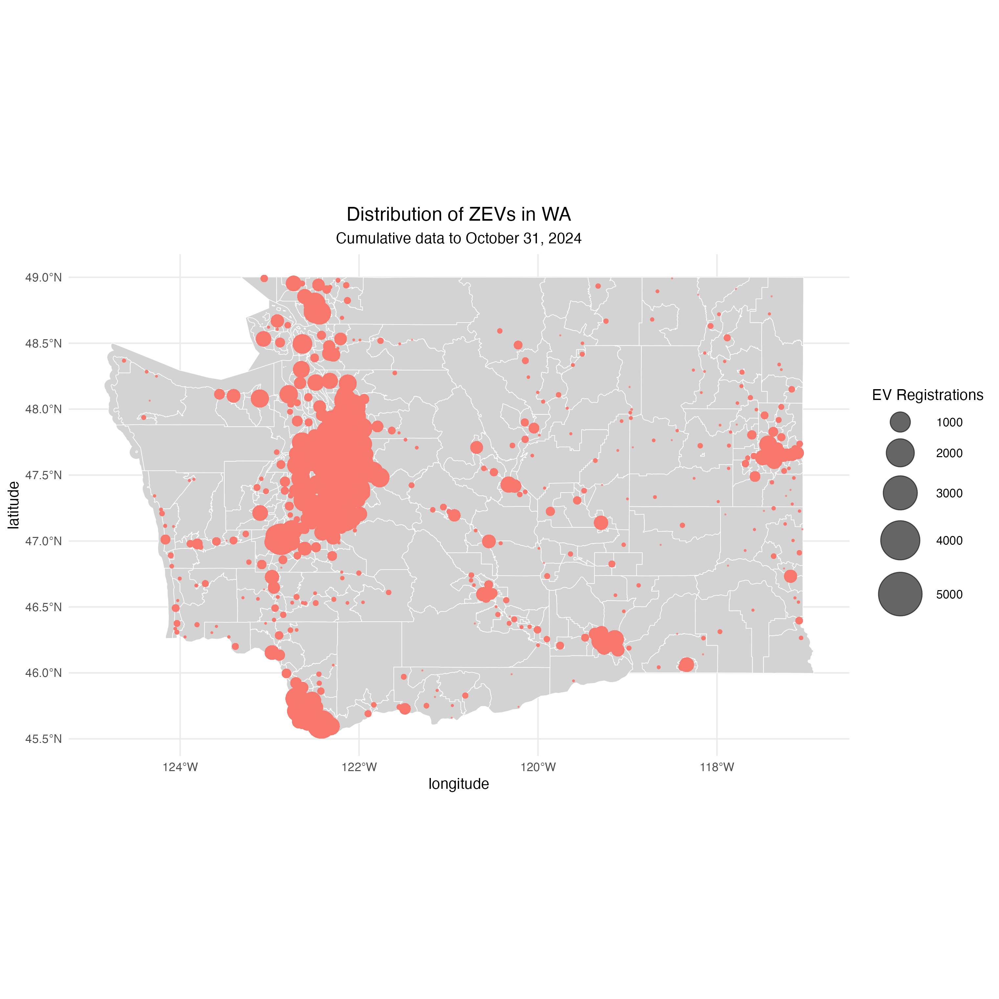

NASA GPW data provides us a glimpse of disaggregated human population data, modeling a human population count for each 1 km^2 grid. We can take it conveniently as a way to make sense of what population point pattern can look like.[1]([International Earth Science Information Network (CIESIN) - Columbia University 2018](#ref-ciesin2018gpw))

`gpw_raster`

[1] Center for International Earth Science Information Network - CIESIN - Columbia University (2018). Gridded Population of the World, Version 4 (GPWv4): Population Count Adjusted to Match 2015 Revision of UN WPP Country Totals, Revision 11. Palisades, NY: NASA Socioeconomic Data and Applications Center (SEDAC). doi: 10.7927/H4PN93PB. Accessed December 4, 2024.

In [ ]:
print(gpw_raster)  # single RasterLayer grid dimensions : 416, 955, 397280  (nrow, ncol, ncell)

class      : RasterLayer 
dimensions : 416, 955, 397280  (nrow, ncol, ncell)
resolution : 0.008333333, 0.008333333  (x, y)
extent     : -124.8667, -116.9083, 45.54167, 49.00833  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
source     : gpw-popcount.tif 
names      : gpw.popcount 

In [ ]:
gpw_poly <- gpw_raster |> raster::rasterToPolygons(n = 8, na.rm = TRUE) 
# adjust n: n: integer. The number of nodes for each polygon. 
# Only 4, 8, and 16 are allowed
popcount_sf <- sf::st_as_sf(gpw_poly)
# head(popcount_sf)

In [ ]:
popcount_sf |> dim() # 304514      2

[1] 304514      2

In [ ]:
# popcount_sf$gpw.popcount |> summary()
popcount_sf <- popcount_sf |> mutate(pop = `gpw.popcount`)
popcount_sf$pop |> summary()

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   0.000    0.000    0.144   24.585    1.504 7425.167 

``` r
gpw_map <- popcount_sf |> ggplot(aes(fill = pop)) +
  geom_sf(color = scales::alpha("white",0)) +
  scale_fill_viridis_c(trans = 'pseudo_log') + 
  theme_minimal() +
  labs(
    title = "Population Counts in WA",
    subtitle = 'GPW V.4 2020-07-01',
    fill = "Population Count"
    ) + 
  theme(
    plot.title = element_text(hjust=0.5),
    plot.subtitle = element_text(hjust=0.5)
    )

ggsave('image/manu-gpw-raster.png', plot = gpw_map)

gpw_map
```

``` r
un_map <- popcount_sf |> ggplot(aes(fill = pop)) +
  geom_sf(color = NA) + 
  scale_fill_viridis(option = 'C', trans = 'pseudo_log') + 
  theme_minimal() +
  labs(
    title = 'Population Count',
    subtitle = 'GPW V.4 2020-07-01',
    fill = 'Population Count'
    )

ggsave('image/manu-gpw-0701.png', plot = un_map)
un_map
```

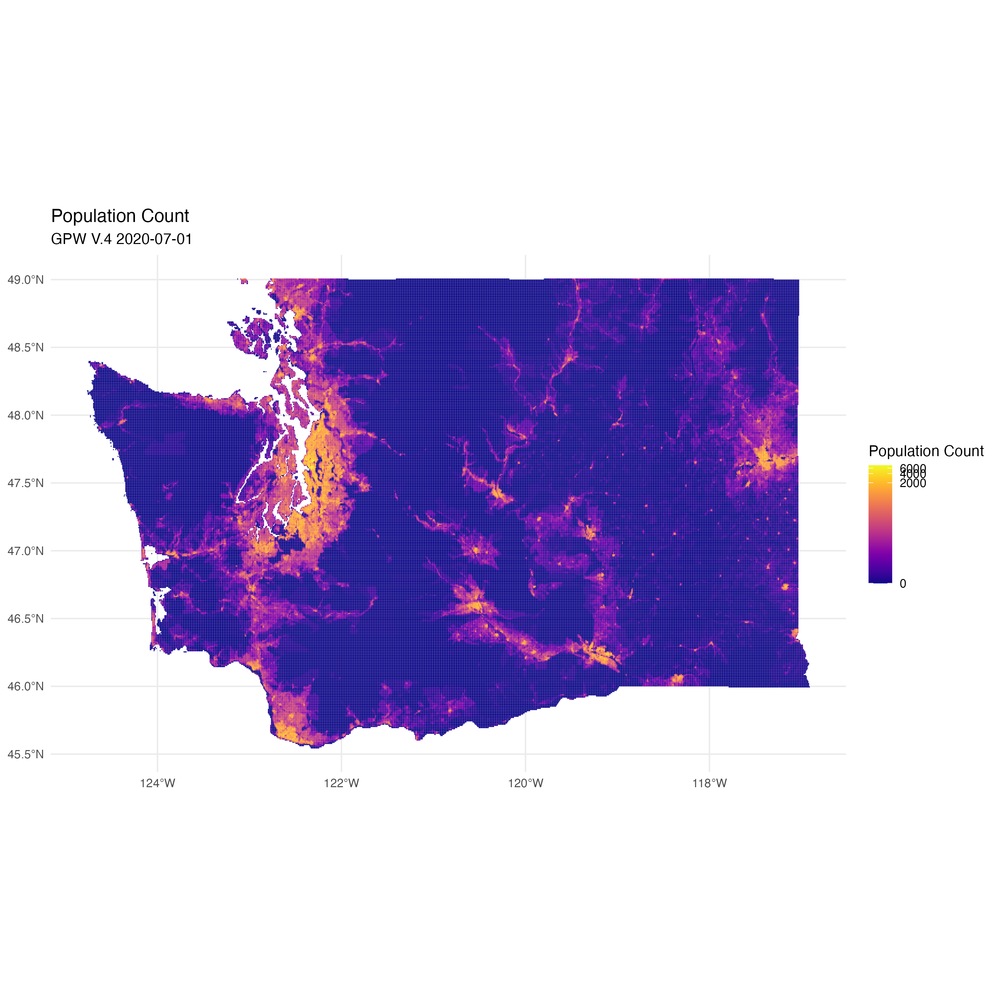

Our null hypothesis is: the observed EV point pattern can be directly explained by the population distribution of WA. In other words, people in WA have equal chance to adopt EV regardless of where they live, rural or urban and also regardless of whether their neighbors own EVs or not.

### First order properties of point process

#### Intensity Function

One important limitation of this analysis that needs to be addressed is that we use the WA state boundaries as our observation window. The drawback of this choice is quite obvious: among the three major metropolitan areas in WA, two are situated at the borders of the state – one with Oregon and the other with Idaho. This can lead to underestimations, as they can have less neighbors as the result of this bounding box.

Intensity function we are interested here is the count of event: count of EVs and count of people in an area

Constructing the `ppp` object for estimating EV population intensity is a more straightforward one, we use the 548 distinct points and marked them with EV registration counts. When it comes to finding an appropriate way to estimate human population intensity, since ZCTAs are not a typical statistical division of US Census Bureau, thus, one way to approach this problem is to use the data of population counts by census tract and use the centroids of the census tracts to construct `ppp` object. Another way we explored is to take the 605 centroids of ZCTAs and request points estimate of population counts also from NASA APPEEARs.([International Earth Science Information Network (CIESIN) - Columbia University 2018](#ref-ciesin2018gpw))

With these ppps at hand `spatstat::density()` can handle these marked ppp and estimate us the intensity function accounting the marks as weights.

##### `zev_ppp`

In [ ]:
ev_counts <- ev_counts |> dplyr::select(count)

In [ ]:
# ***
tr_counts_sf <- ev_counts |> sf::st_transform(3857)
wa_poly <- wa_poly |> sf::st_transform(3857)
zev_ppp <- as.ppp(
  tr_counts_sf,
  W = as.owin(wa_poly)
)

zev_ppp$marks <- ev_counts$count

In [ ]:
zev_int <- density(zev_ppp, weights = zev_ppp$marks, eps = 800)

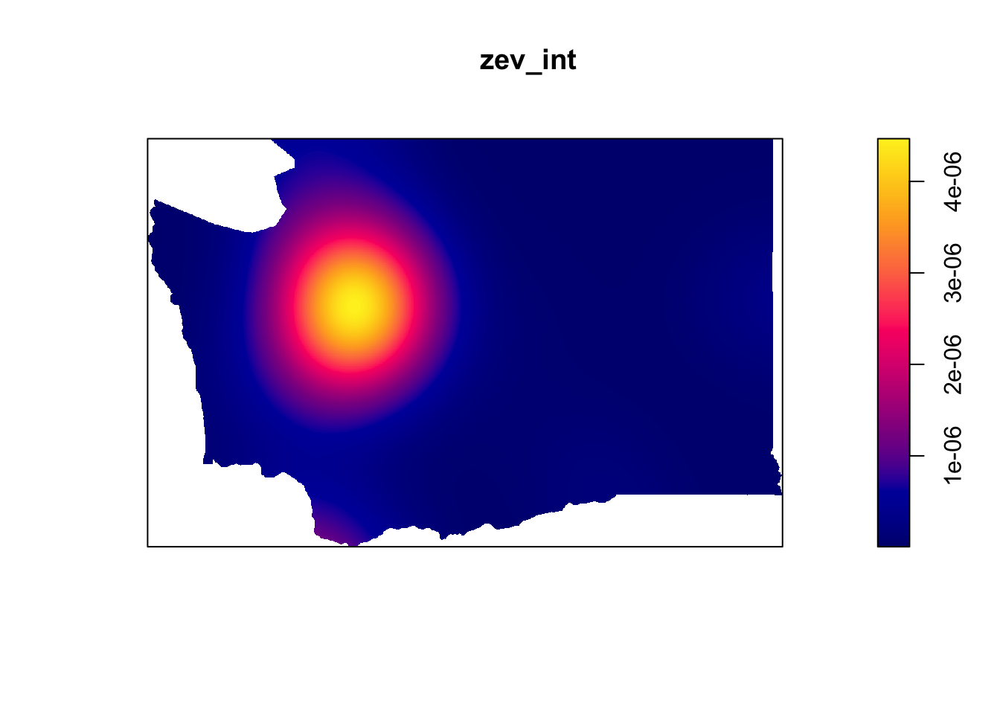

In [ ]:
plot(zev_int)

In [ ]:
zev_bw <- attr(density(zev_ppp), "sigma")
zev_bw

[1] 70971.96

[1] 1.490786e-07

##### `pop_int`

In [ ]:
fips_centroid_sf <- fips_df |> sf::st_as_sf(
  coords = c("INTPTLON20", "INTPTLAT20"),
  crs = 4326
  )
pop_sf <- fips_centroid_sf |> dplyr::select(DP1_0001C)
pop_ppp <- pop_sf |> sf_to_ppp()
pop_ppp$marks <- pop_sf$DP1_0001C

In [ ]:
pop_ppp$marks |> sum()    # 7705281

[1] 7705281

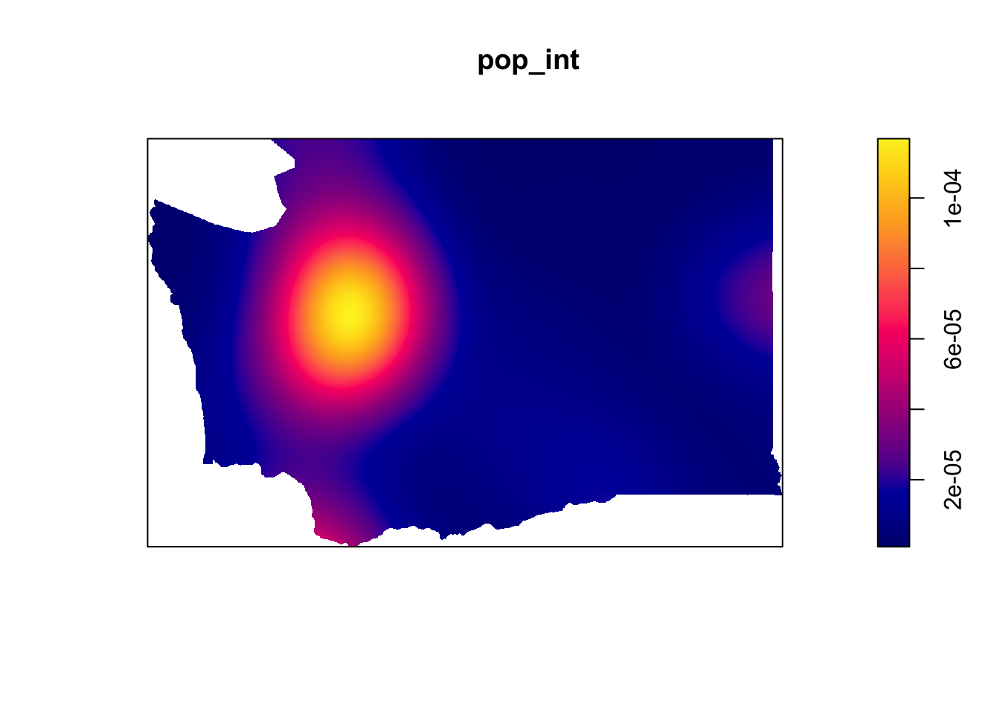

In [ ]:
pop_int <- pop_ppp |> density(
  weights = pop_ppp$marks,
  eps = 800
  )
plot(pop_int)

``` r
# png('image/manu-ct-ratio.png', width = 750, height = 500)
relative_int(zev_ppp, pop_ppp)
# dev.off()
```

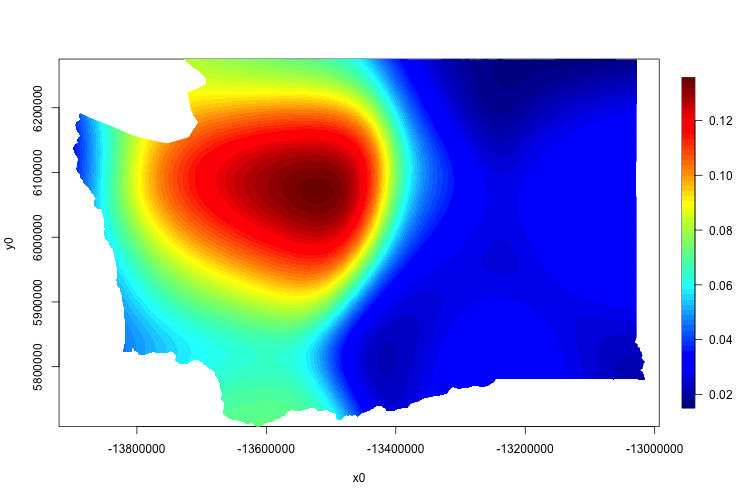

With these ppps at hand `spatstat::density()` can handle these marked ppp and estimate us the intensity function accounting the marks as weights.

##### `gpw_ppp`

In [ ]:
# gpw_zpts_df$Date |> summary() # 2020-07-01
zpts_sf <- gpw_pts_df |> sf::st_as_sf(
  coords = c('Longitude', 'Latitude'),
  crs = 4326
)

In [ ]:
zpts_sf <- zpts_sf |> mutate(
  pop_count = `GPW_UN_Adj_PopCount_411_population-count`
)

In [ ]:
# zpts_sf$pop_count |> sum() # 308385.8
# mapview(zpts_sf, zcol = 'pop_count', label = 'pop_count')

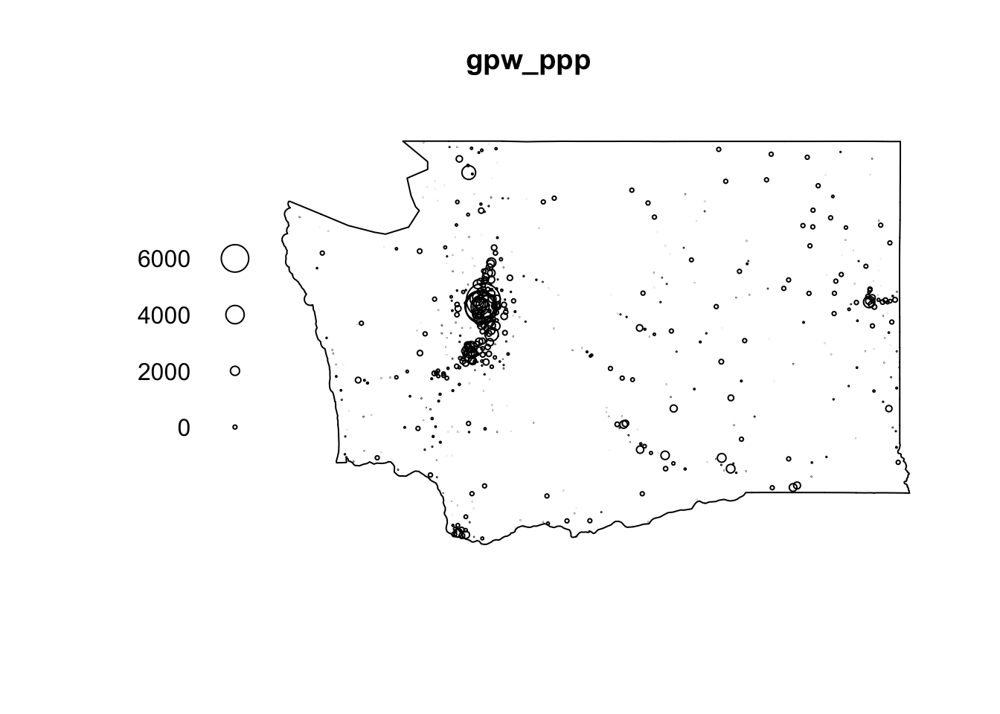

In [ ]:
gpw_sf <- zpts_sf |> dplyr::select(pop_count) |> sf::st_transform(3857)
wa_poly <- wa_poly |> sf::st_transform(3857)
gpw_ppp <- as.ppp(
  gpw_sf,
  W = as.owin(wa_poly)
)
plot(gpw_ppp)

In [ ]:
gpw_ppp$marks |> sum()

[1] 308385.8

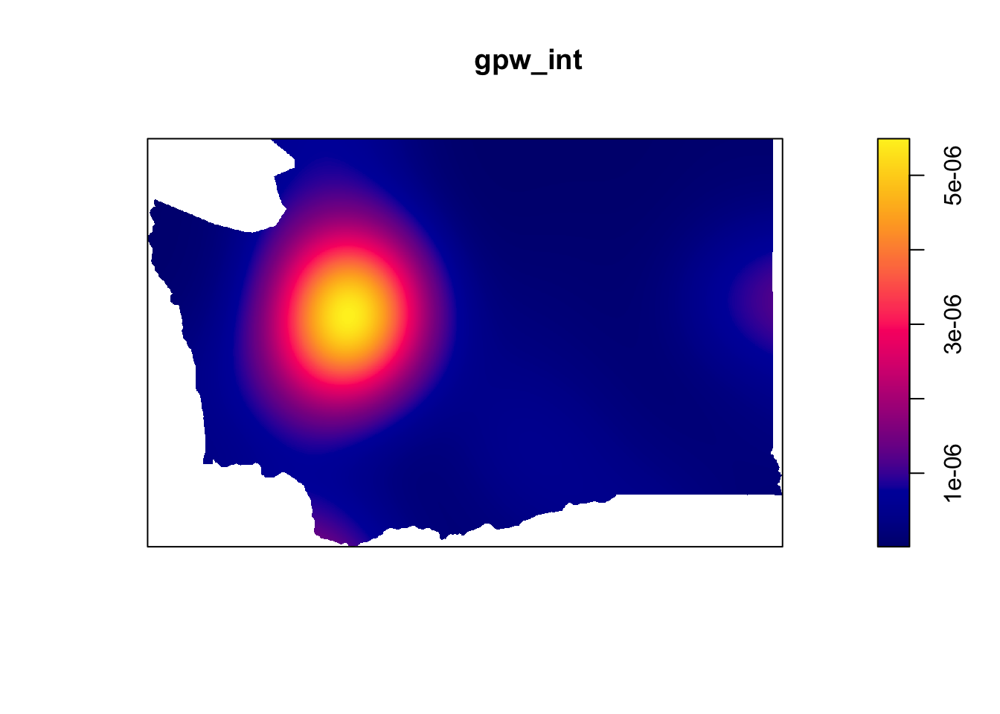

In [ ]:
gpw_int <- gpw_ppp |> density(weights = gpw_ppp$marks, eps = 800)
gpw_int |> plot()

``` r
# png('image/manu-zpts-ratio.png', width = 750, height = 500)
relative_int(zev_ppp, gpw_ppp)
# dev.off()
```

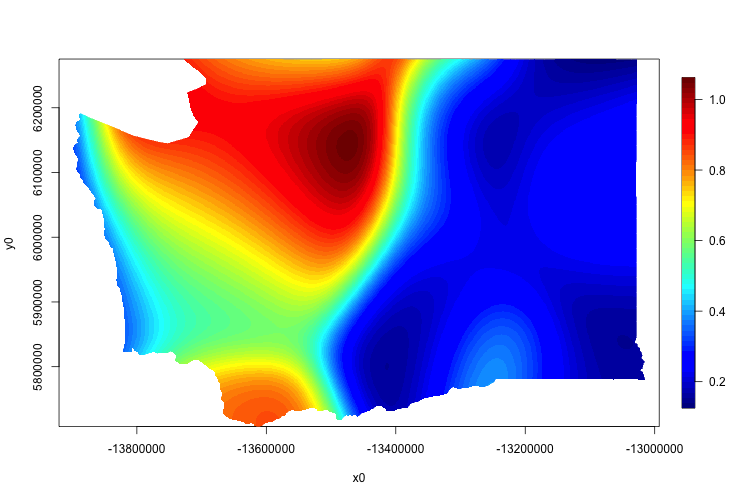

#### Relative Intensity Surface

We use the optimal bandwidths given by spatstat and make adjustments to calculate intensity ratios between our case point pattern to the base rate point pattern. By eliminating the effect of the human population intensity of WA, the relative intensity surface plots still exhibit uneven ratio from location to location suggesting us that point pattern of EV population is a special one.[1]

#### Monte Carlo Simulation

We deploy quadrat count to understand how intensity varies from dividing the state in to equal regions of “Low”, “Medium” and “High” population. Two intensity functions constructed by Census tract level population count and GPW population count are used as the null point process in the Monte Carlo simulation.

##### divide regions for quadrat count

[1] the interpretation of the ratio values have things to do with the different number of points between ppp objects, but the color variances is interpretable

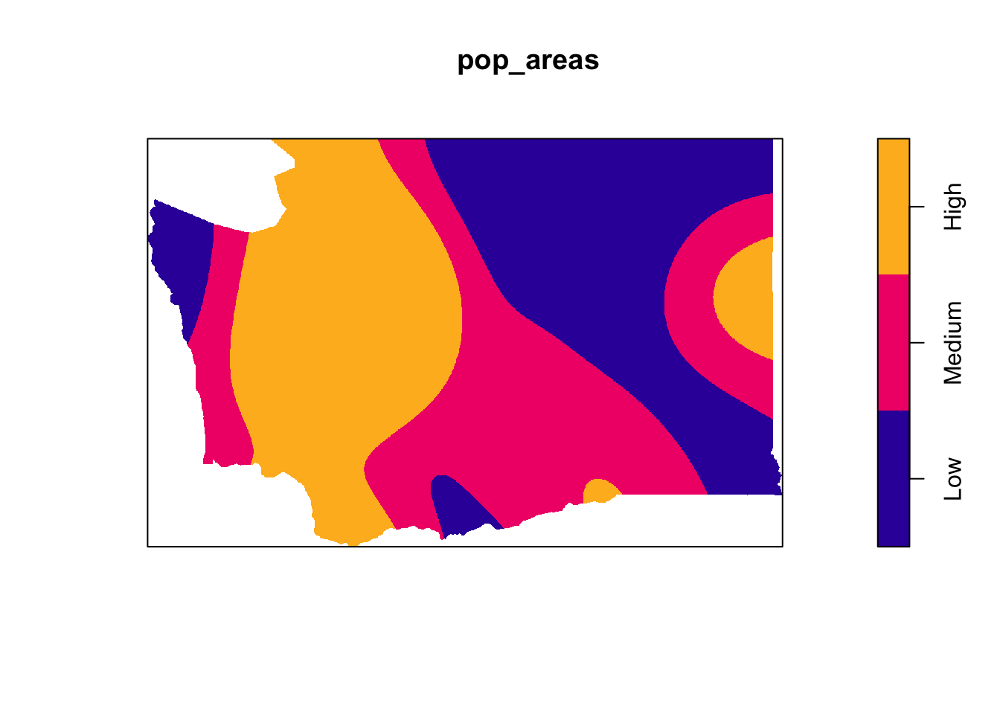

In [ ]:
n_regions <- 3
region_labels <- c("Low", "Medium", "High")
pop_vals <- pop_int
pop_quant <- quantile(pop_vals, probs = ((0:n_regions) / n_regions), na.rm = TRUE)
pop_cut <- cut(pop_vals, breaks = pop_quant, labels = region_labels)

pop_areas <- tess(image = pop_cut)
plot(pop_areas)

##### computational approach: 999 simulations

``` r
set.seed(6805)
gen_sims_ppp <- function(num_sims = 999) {
  ev_sims <- spatstat.random::rpoint(
    n = nrow(ev_sf),
    f = pop_int,
    nsim = num_sims
    )
  return(ev_sims)
}
n_sims <- 999
ev_sims_list <- gen_sims_ppp()
```

In [ ]:
compute_quadrat_counts <- function(sim_ppp) {
  counts <- quadratcount(
    sim_ppp,
    tess = pop_areas
    ) |> as.vector()
  names(counts) <- region_labels

  return(counts)
}

##### calculate test statistic from observations

In [ ]:
ev_ppp <- ev_sf |> sf_to_ppp()

   Low Medium   High 
  1644   9001 197357 

##### calculate test statistic from simulations

``` r
sims_region_counts <- lapply(
  X = ev_sims_list,
  FUN = compute_quadrat_counts
)
sim_counts_df <- as_tibble(sims_region_counts) |> t() |> as_tibble()
colnames(sim_counts_df) <- region_labels
sim_counts_df |> head(4)
```

``` r
bind_df <- bind_rows(sim_counts_df, obs_counts)
bind_df |> dim()
bind_df |> write_csv('data/manu-simulations.csv')
```

In [ ]:
bind_df <- read_csv('data/manu-simulations.csv')

Rows: 1000 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (3): Low, Medium, High

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

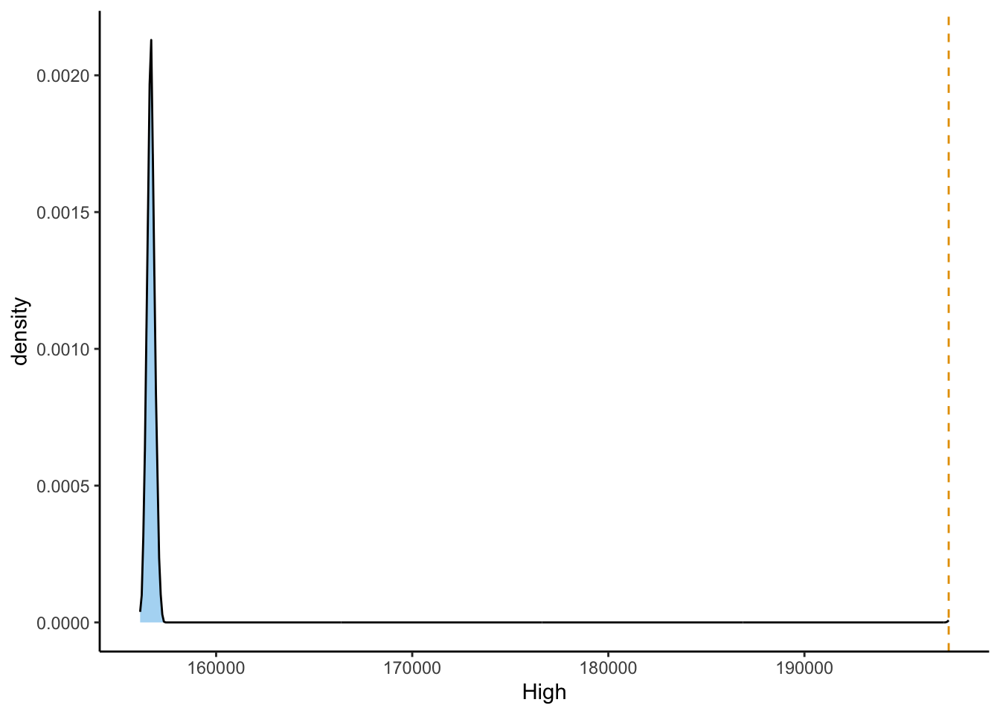

In [ ]:
simulations_plot <- bind_df |> ggplot(aes(x=High)) +
  geom_density(fill=cb_palette[2], alpha=0.5) +
  geom_vline(xintercept = obs_counts['High'], linetype="dashed", color=cb_palette[1]) + 
  theme_classic()

# ggsave("image/manu-sims-distribution.png", plot = simulations_plot, width = 14, height = 6)
simulations_plot

``` r
mc_sim <- function(im,fpath1, fpath2, num_sims = 999){
  n_regions <- 3
  region_labels <- c("Low", "Medium", "High")
  int_vals <- im
  int_quant <- quantile(int_vals,probs = ((0:n_regions) / n_regions), na.rm = TRUE)
  int_cut <- cut(int_vals, breaks = int_quant, labels = region_labels)

  int_areas <- tess(image = int_cut)
  plot(int_areas)

  set.seed(6805)
  gen_sims_ppp <- function(num_sims) {
    spatstat.random::rpoint(
      n = nrow(ev_sf),
      f = im,
      nsim = num_sims)
  }
  
  sims_list <- gen_sims_ppp(num_sims)

  compute_quadrat_counts <- function(sim_ppp) {
    counts <- quadratcount(sim_ppp, tess = int_areas) |> as.vector()
    names(counts) <- region_labels
    return(counts)
  }

  ev_ppp <- sf_to_ppp(ev_sf)
  obs <- compute_quadrat_counts(ev_ppp)

  sims_region_counts <- lapply(
    X = ev_sims_list,
    FUN = compute_quadrat_counts
    )
  sim_counts_df <- as_tibble(sims_region_counts) |> t() |> as_tibble()
  colnames(sim_counts_df) <- region_labels

  bind_df <- bind_rows(sim_counts_df, obs_counts)
  bind_df |> write_csv(fpath1)

  sims_plot <- bind_df |> 
    ggplot(aes(x = High)) +
    geom_density(fill = cb_palette[2], alpha = 0.5) +
    geom_vline(
      xintercept = obs['High'],
      linetype = "dashed",
      color = cb_palette[1]
      ) + 
    theme_classic()

  ggsave(fpath2, plot = sims_plot, width = 14, height = 6)
  
  return(sims_plot)
}
```

``` r
mc_sim(gpw_int, 'data/gpw-sims.csv', 'image/gpw-distribution.png')
```

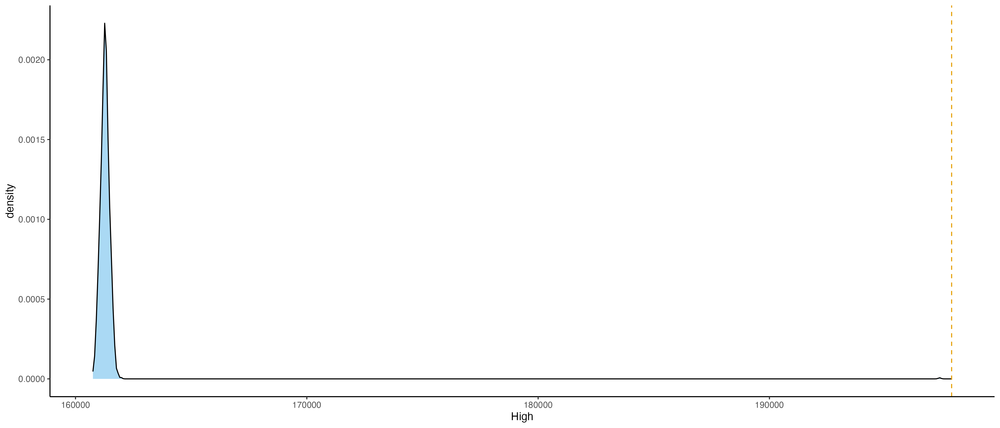

The computational approach gives us an entire distribution of our statistics of interest, under the simulations of distributing 208002 EV registrations by human population point process. Given that the observed value lies on the far right tail of the distribution, the likelihood for us to observe 197,900 EV registrations in high population regions is a very low one. Therefore, we can believe that the null hypothesis is not likely to stand.

The significance of our observed statistics in high population areas is more like a general picture that justifies our attentions to the spatial phenomenon of EVs, however, the findings from LISA Cluster Map from the relative intensity ratio do ask us to pay attention to local differences and how these local differences can contribute to the characteristics of the whole point pattern.

## Discussion

With the evidence of clustering and after extracting the effect of population intensity, we have evidence to describe EV population point pattern in WA as a whole spatially clustering, and to think about the implications of this overall unevenness. At the same time, the local perspective offers insights into the relationship between attributes and locations in significant clusters.

Knowing the adoption pattern and characteristics of those who already owns an EV might be a way of analyzing the issue of electric vehicle, if the aim of the issue is to anticipate a wider adoption and to eliminate the inequality, getting the glimpse of Low-Low clusters in many ways can be even more insightful. Another way to think of this issue is that of EV owning households today assumingly already have a positive view on EV and they made the decision of buying an EV rationally after evaluating their own living circumstances. Thus, to promote a more positive and decent view on electric vehicles and to prepare a more friendly environment that can support EV purchases, it is evident that more efforts should be made for the Low-Low clusters.

## Conclusion

One perspective confirmed by this project is that, it is actually not that hard to discover EV hotspots, we can find them generally in the urban areas or metro areas, though they may have different degrees of concentration. For example, the heart of Seattle Metro area, census tracts in King County out-performed both the CRS distribution and population distribution. In the case of Clark county and Spokane city, the results are less significant, however, may be due to the effect of the observation window. On the other hand, detecting coldspots requires many more steps, and we tend to underestimate the contribution of local Low-Low clusters to the global clusterness. But coldspots are indeed part of–and might be the essence of–the inequality behind the uneven spatial pattern of EV adoption.

Most of the analysis in this project is at the exploratory stage. As the last section of the project, we are to think about where the EDA result can take us.

Two of the main reason that people usually give for not considering an EV are: EVs are not affordable, and that EVs are not reliable in terms of the lack of access to charging equipment. ([Kikuchi 2024](#ref-kikuchi310Americans2024))

Income and charging station accessibility, at a glance are both following spatial distributions similar toEV population and urban-rural divisions. Research on EVs has devoted much efforts carrying out the message that, with possible rebates to make the upfront cost of purchasing an EV less burdensome, EVs can, in the long term, save commuters more money than petro and diesel cars. As for the range anxiety, which is more expressed by potential EV owners than by actual EV owners, it is explained by that most recent EV owners charge their vehicles at home on daily bases. This implies that they have private parking spaces, can afford to install home charging equipment, and the electric range of their EVs is just sufficient for their daily commute distances. ([“Alternative Fuels Data Center: Charging Electric Vehicles at Home” n.d.](#ref-AlternativeFuelsDatag))

But these facts of today are not there to convince us that affordability and public charging infrastructure don’t really matter much in the decision of buying an EV. Instead, they can lead us to see that the diffusion of EVs at a stage where barriers between owners and potential owners are not only material but also in knowledge.

Looking forward to the 2030 ZEV mandate, all newly sold vehicles electric, one solution is to make the most of EV charging station. An analysis by Pew Research Center offers an interesting way to think about public charging stations.([Shah 2024](#ref-shahElectricVehicleCharging2024)) Or, people need to see charging stations for they to develop confidence in EV before they really use them or even before people actually own an EV.

Addressing the unevenness of adoption and the importance of the visibility of EV charging station in the EV diffusion process, can be seen in how Induction Reduction Act incentives target EV charging stations in rural areas, and in reseach exploring models to determine the optimal locations for EV charging station installations. ([Needell et al. 2016](#ref-trancik16potential))

The following note is an attempt to take the previous approaches, but this time analyzing the distribution of EV charging station. Some early findings from the relative intensity ratio of charging stations on EV registrations are that the charging station distribution is somewhat more even compared to the EV registrations.

> **Distribution of Public Charging Stations in WA**
>
> ``` python
> import requests
>
> api_key = AFDCKEY
>
> url = f'https://developer.nrel.gov/api/alt-fuel-stations/v1.csv?api_key={api_key}&fuel_type=ELEC&state=WA&access=public'
> output_file = 'data/ev_charging_stations_wa.csv'
> response = requests.get(url)
> if response.status_code == 200:
>     with open(output_file, 'wb') as f:
>         f.write(response.content)
>     print(f"{output_file}")
> else:
>     print(f"status code {response.status_code}: {response.text}")
> ```
>
> ``` r
> station_df <- read_csv('data/ev_charging_stations_wa.csv')
> ```
>
>     Warning: One or more parsing issues, call `problems()` on your data frame for details,
>     e.g.:
>       dat <- vroom(...)
>       problems(dat)
>
>     Rows: 2662 Columns: 75
>     ── Column specification ────────────────────────────────────────────────────────
>     Delimiter: ","
>     chr  (26): Fuel Type Code, Station Name, Street Address, Intersection Direct...
>     dbl   (7): ZIP, EV Level1 EVSE Num, EV Level2 EVSE Num, EV DC Fast Count, La...
>     lgl  (39): Plus4, BD Blends, NG Fill Type Code, NG PSI, EV Other Info, Feder...
>     date  (3): Expected Date, Date Last Confirmed, Open Date
>
>     ℹ Use `spec()` to retrieve the full column specification for this data.
>     ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
>
> ``` r
> # station_df |> colnames()
> ```
>
> ``` r
> station_df <- station_df |> dplyr::select(`Station Name`, `City`, `ZIP`, `EV Level1 EVSE Num`, `EV Level2 EVSE Num`, `EV DC Fast Count`, `Latitude`, `Longitude`)
> ```
>
> ``` r
> evse_sf <- station_df |> sf::st_as_sf(
>   coords = c("Longitude", "Latitude"),
>   crs = 4326
> )
> # mapview(evse_sf)
> ```
>
> 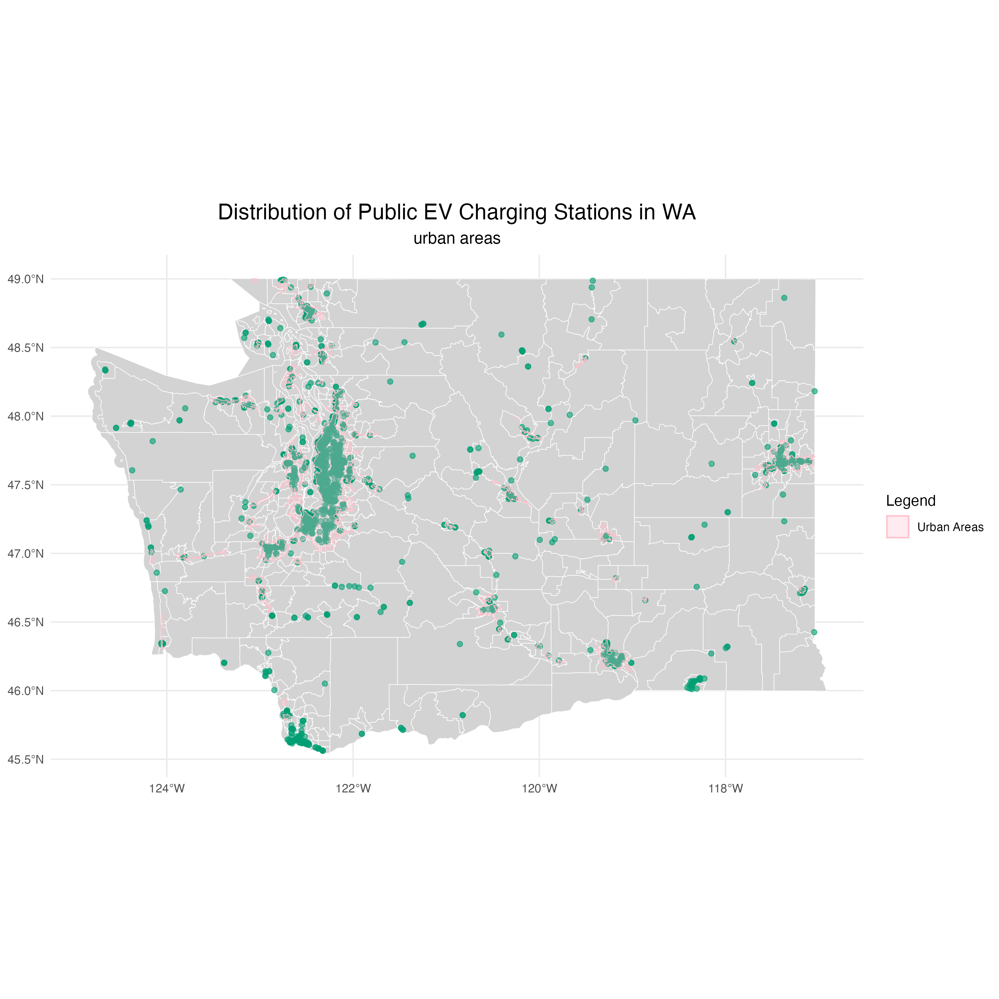
>
> ``` r
> # evse_sf |> sf::st_write('evse.gpkg')
> ```
>
> ``` r
> evse_sf <- sf::st_read('data/evse.gpkg')
> ```
>
>     Reading layer `evse' from data source `/Users/toyuan/24-manuscript/data/evse.gpkg' using driver `GPKG'
>     Simple feature collection with 2662 features and 6 fields
>     Geometry type: POINT
>     Dimension:     XY
>     Bounding box:  xmin: -124.6629 ymin: 45.56257 xmax: -117.0435 ymax: 48.99526
>     Geodetic CRS:  WGS 84
>
> ``` r
> station_counts <- evse_sf |> group_by(geom) |> summarize(count = n())
> station_counts |> summary()
> ```
>
>                 geom          count      
>      POINT        :2647   Min.   :1.000  
>      epsg:4326    :   0   1st Qu.:1.000  
>      +proj=long...:   0   Median :1.000  
>                           Mean   :1.006  
>                           3rd Qu.:1.000  
>                           Max.   :2.000  
>
> ``` r
> urb_station_map <- ggplot() +
>   geom_sf(data = ct_sf, fill = "lightgray", color = "white", size = 0.2) + 
>   geom_sf(data = wa_stations_sf, color = cb_palette[3], alpha = 0.6) +
>   geom_sf(data = to_4326(urban_poly), aes(fill = "Urban Areas"), color = "pink", alpha = 0.3) +
>   scale_fill_manual(name = "Legend", values = c("Urban Areas" = "pink")) +
>   labs(
>     title = "Distribution of Public EV Charging Stations in WA",
>     subtitle = "urban areas"
>   ) +
>   theme_minimal() +
>   theme(
>     plot.title = element_text(hjust = 0.5, size = 16),
>     plot.subtitle = element_text(hjust = 0.5, size = 12)
>   )
>
> ggsave("image/manu-urb-stations.png", plot = urb_station_map)
> urb_station_map
> # 4326
> ```
>
> ``` r
> evse_ppp <- evse_sf |> sf_to_ppp() |> plot()
> ```
>
>     Warning: data contain duplicated points
>
> 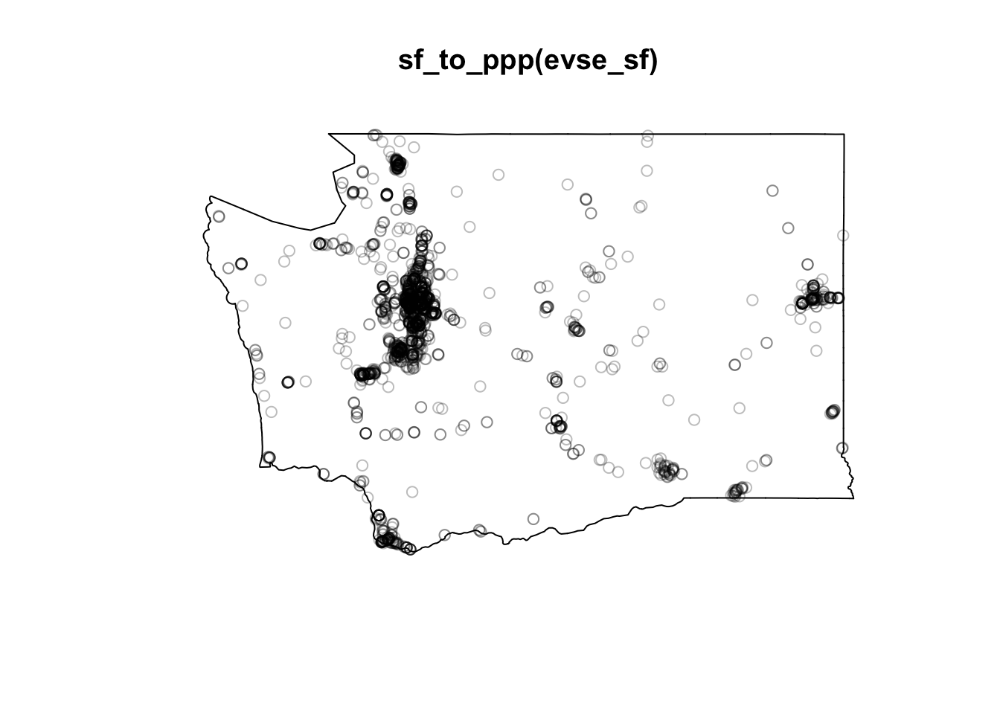
>
> `station_ppp`
>
> ``` r
> station_ppp <- station_counts |> sf_to_ppp()
> # plot(station_ppp)
> station_ppp$marks <- station_counts$count
> ```
>
> ``` r
> # dup_pts <- duplicated(station_ppp)
> # station_ppp2 <- station_ppp[!dup_pts]
> station_ppp |> npoints()
> ```
>
>     [1] 2647
>
> ``` r
> station_int <- density(
>   station_ppp,
>   weights = station_ppp$marks,
>   eps = 800
> )
> plot(station_int)
> ```
>
> 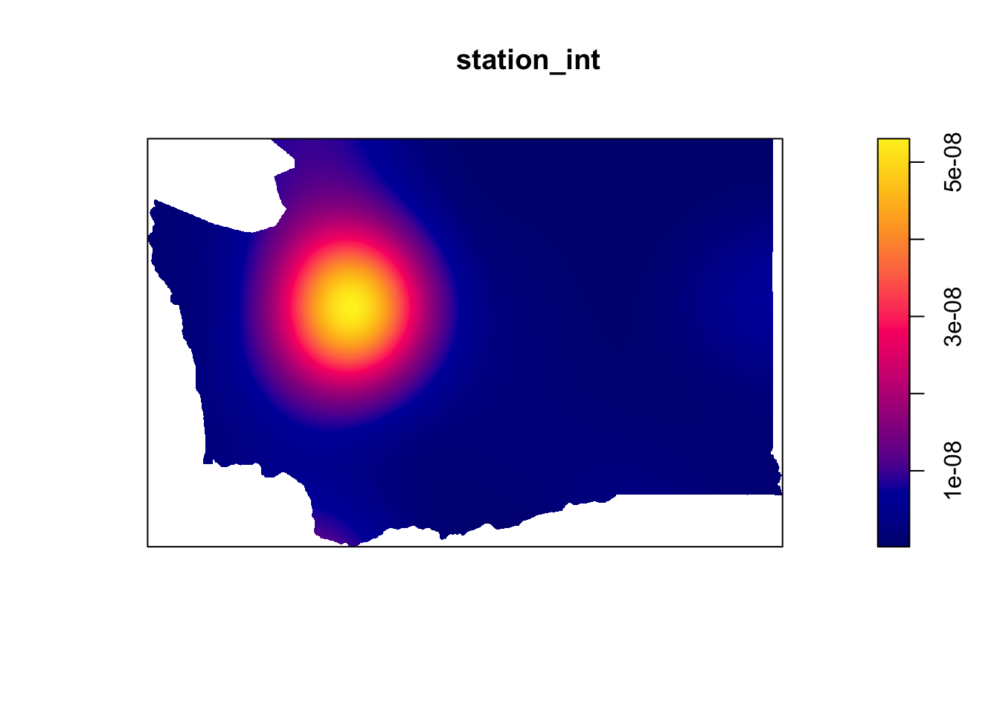
>
> ``` r
> png('image/manu-station-ratio.png', width = 750, height = 500)
> relative_int(station_ppp, zev_ppp)
> dev.off()
> ```
>
> 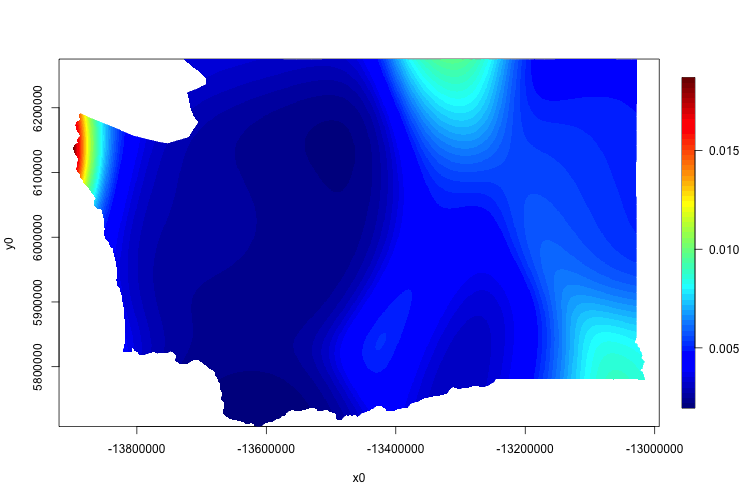
>
> ``` r
> n_regions <- 3
> region_labels <- c("Low", "Medium", "High")
> zev_vals <- zev_int
> zev_quant <- quantile(zev_vals, probs = ((0:n_regions) / n_regions), na.rm = TRUE)
> zev_cut <- cut(zev_vals, breaks = zev_quant, labels = region_labels)
>
> zev_areas <- tess(image = zev_cut)
> plot(zev_areas)
> ```
>
> 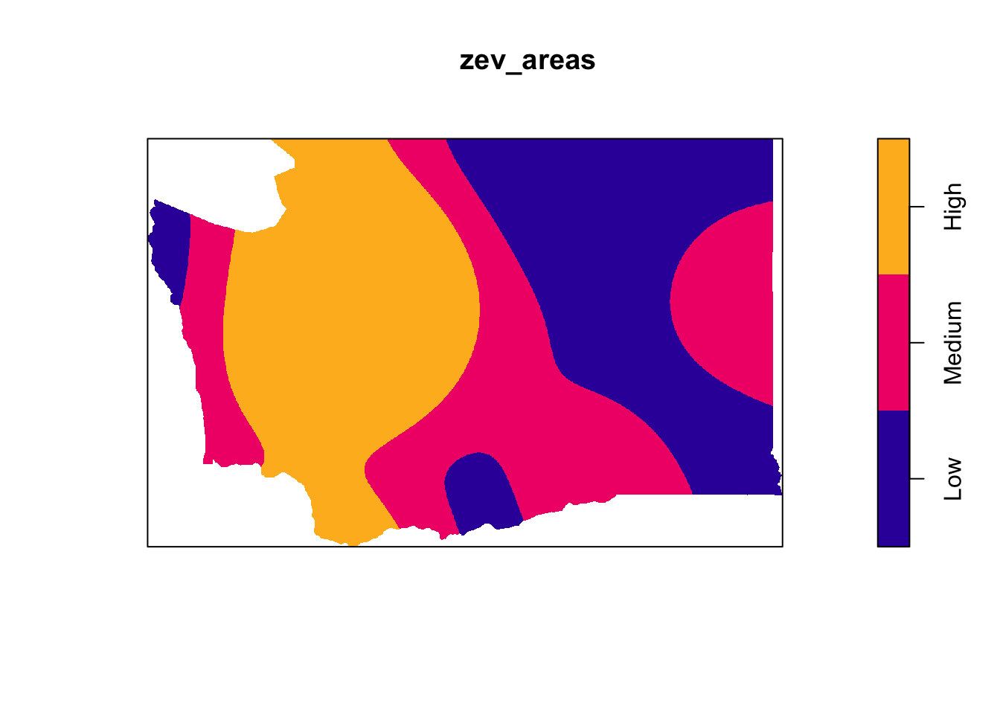
>
> ``` r
> set.seed(6805)
> evse_sims_ppp <- function(num_sims = 999) {
>   evse_sims <- spatstat.random::rpoint(
>     n = nrow(evse_sf),
>     f = zev_int,
>     nsim = num_sims
>     )
>   return(evse_sims)
> }
> n_sims <- 999
> evse_sims_list <- evse_sims_ppp()
> ```
>
> ``` r
> compute_quadrat_counts2 <- function(sim_ppp) {
>   counts <- quadratcount(sim_ppp, tess = zev_areas) |> as.vector()
>   names(counts) <- region_labels
>
>   return(counts)
> }
> ```
>
> ``` r
> obs_evse <- compute_quadrat_counts2(station_ppp)
> obs_evse
> ```
>
> ``` r
> sim_evse_counts <- lapply(
>   X = evse_sims_list,
>   FUN = compute_quadrat_counts2
> )
> sim_evse_df <- as_tibble(sim_evse_counts) |> t() |> as_tibble()
> colnames(sim_evse_df) <- region_labels
> sim_evse_df |> head(4)
> ```
>
> ``` r
> bind_evse_df <- bind_rows(sim_evse_df, obs_evse)
> bind_evse_df |> dim()
> ```
>
> ``` r
> evse_sim_plot <- bind_evse_df |>
>   ggplot(aes(x=Medium)) + 
>   geom_density(fill=cb_palette[2], alpha = 0.5) +
>   geom_vline(xintercept = obs_evse['Medium'], linetype = 'dashed', color = cb_palette[1]) + 
>   theme_classic()
>
> evse_sim_plot
> ggsave('image/evse-sims-plot.png', evse_sim_plot)
> ```
>
> 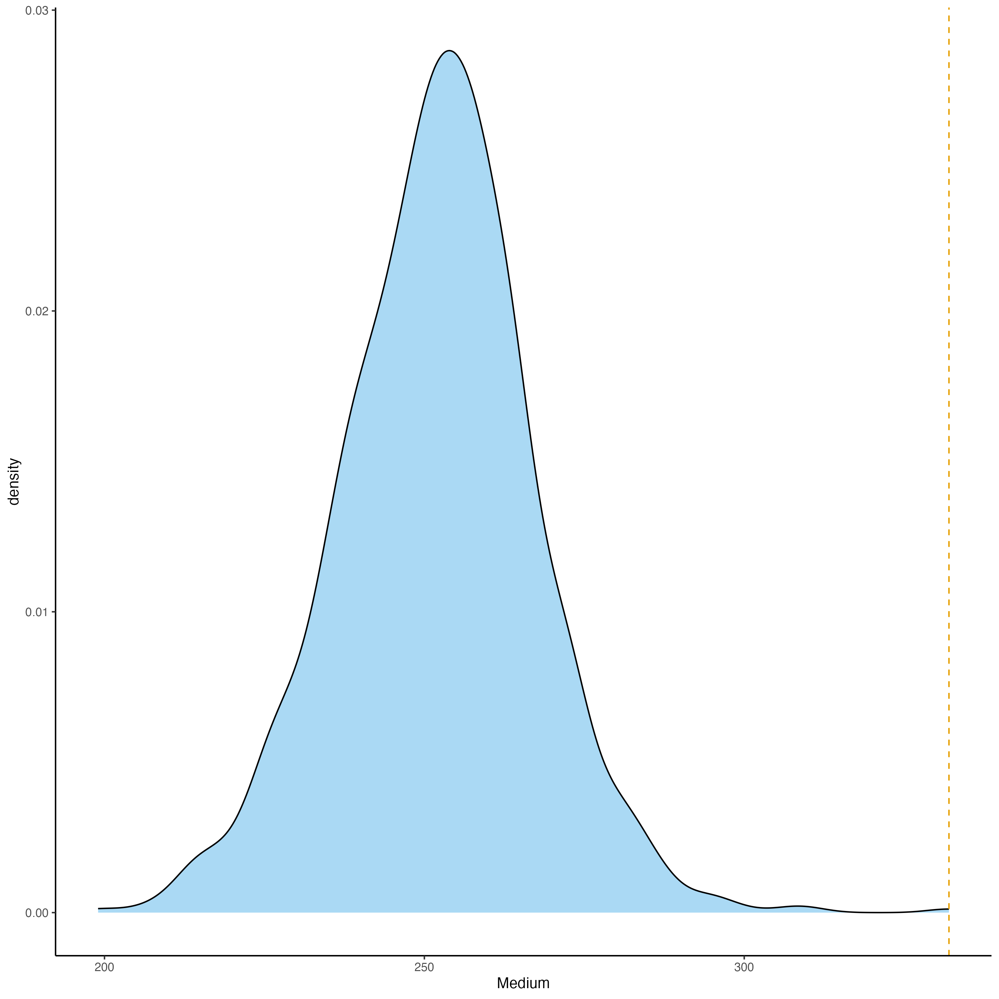

For the interpretation of the interesting census tracts we find in the LISA cluster map, there is much to anticipate if domain knowledge of the state and locals is introduced.

“Alternative Fuels Data Center: Charging Electric Vehicles at Home.” n.d. https://afdc.energy.gov/fuels/electricity-charging-home. Accessed December 1, 2024.

Bureau, US Census. n.d. “Metropolitan and Micropolitan Statistical Areas Population Totals: 2020-2023.” *Census.gov*. https://www.census.gov/data/tables/time-series/demo/popest/2020s-total-metro-and-micro-statistical-areas.html. Accessed December 10, 2024.

“Electric Vehicle Population Data Data.WA State of Washington.” 2024. https://data.wa.gov/Transportation/Electric-Vehicle-Population-Data/f6w7-q2d2/about_data; data.wa.gov.

GeoDa Software. 2021. “Week 6a: LISA and Local Moran (Introduction to Spatial Data Science).”

International Earth Science Information Network (CIESIN) - Columbia University, Center for. 2018. “Gridded Population of the World, Version 4 (GPWv4): Population Count Adjusted to Match 2015 Revision of UN WPP Country Totals, Revision 11.” Palisades, NY: NASA Socioeconomic Data; Applications Center (SEDAC). <https://doi.org/10.7927/H4PN93PB>.

Kikuchi, Alec Tyson and Emma. 2024. “About 3 in 10 Americans Would Seriously Consider Buying an Electric Vehicle.” *Pew Research Center*. <https://www.pewresearch.org/short-reads/2024/06/27/about-3-in-10-americans-would-seriously-consider-buying-an-electric-vehicle/>.

Needell, Zachary A., James Mcnerney, Michael T. Chang, and Jessika E. Trancik. 2016. “Potential for Widespread Electrification of Personal Vehicle Travel in the United States.” *Nature Energy* 1 (August): 16112. <https://proxy.library.georgetown.edu/login?url=https://www.proquest.com/scholarly-journals/potential-widespread-electrification-personal/docview/2218221398/se-2>.

R Consortium. 2022. “Analyzing Geospatial Data in R (Sherrie Xie).”

Shah, Samuel Bestvater and Sono. 2024. “Electric Vehicle Charging Infrastructure in the U.S.” *Pew Research Center*. <https://www.pewresearch.org/data-labs/2024/05/23/electric-vehicle-charging-infrastructure-in-the-u-s/>.